con las siguientes variables:

* **Características de entrada:**
* SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
* MSSubClass: The building class
* MSZoning: The general zoning classification
* LotFrontage: Linear feet of street connected to property
* LotArea: Lot size in square feet
* Street: Type of road access
* Alley: Type of alley access
* LotShape: General shape of property
* LandContour: Flatness of the property
* Utilities: Type of utilities available
* LotConfig: Lot configuration
* LandSlope: Slope of property
* Neighborhood: Physical locations within Ames city limits
* Condition1: Proximity to main road or railroad
* Condition2: Proximity to main road or railroad (if a second is present)
* BldgType: Type of dwelling
* HouseStyle: Style of dwelling
* OverallQual: Overall material and finish quality
* OverallCond: Overall condition rating
* YearBuilt: Original construction date
* YearRemodAdd: Remodel date
* RoofStyle: Type of roof
* RoofMatl: Roof material
* Exterior1st: Exterior covering on house
* Exterior2nd: Exterior covering on house (if more than one material)
* MasVnrType: Masonry veneer type
* MasVnrArea: Masonry veneer area in square feet
* ExterQual: Exterior material quality
* ExterCond: Present condition of the material on the exterior
* Foundation: Type of foundation
* BsmtQual: Height of the basement
* BsmtCond: General condition of the basement
* BsmtExposure: Walkout or garden level basement walls
* BsmtFinType1: Quality of basement finished area
* BsmtFinSF1: Type 1 finished square feet
* BsmtFinType2: Quality of second finished area (if present)
* BsmtFinSF2: Type 2 finished square feet
* BsmtUnfSF: Unfinished square feet of basement area
* TotalBsmtSF: Total square feet of basement area
* Heating: Type of heating
* HeatingQC: Heating quality and condition
* CentralAir: Central air conditioning
* Electrical: Electrical system
* 1stFlrSF: First Floor square feet
* 2ndFlrSF: Second floor square feet
* LowQualFinSF: Low quality finished square feet (all floors)
* GrLivArea: Above grade (ground) living area square feet
* BsmtFullBath: Basement full bathrooms
* BsmtHalfBath: Basement half bathrooms
* FullBath: Full bathrooms above grade
* HalfBath: Half baths above grade
* Bedroom: Number of bedrooms above basement level
* Kitchen: Number of kitchens
* KitchenQual: Kitchen quality
* TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
* Functional: Home functionality rating
* Fireplaces: Number of fireplaces
* FireplaceQu: Fireplace quality
* GarageType: Garage location
* GarageYrBlt: Year garage was built
* GarageFinish: Interior finish of the garage
* GarageCars: Size of garage in car capacity
* GarageArea: Size of garage in square feet
* GarageQual: Garage quality
* GarageCond: Garage condition
* PavedDrive: Paved driveway
* WoodDeckSF: Wood deck area in square feet
* OpenPorchSF: Open porch area in square feet
* EnclosedPorch: Enclosed porch area in square feet
* 3SsnPorch: Three season porch area in square feet
* ScreenPorch: Screen porch area in square feet
* PoolArea: Pool area in square feet
* PoolQC: Pool quality
* Fence: Fence quality
* MiscFeature: Miscellaneous feature not covered in other categories
* MiscVal: $Value of miscellaneous feature
* MoSold: Month Sold
* YrSold: Year Sold
* SaleType: Type of sale
* SaleCondition: Condition of sale


In [1]:
from google.colab import drive

drive.mount('/content/drive')

# Rutas de los archivos en tu Google Drive
file_path = '/content/drive/MyDrive/Colab Notebooks/train.csv'

Mounted at /content/drive


In [3]:
# Para resetear
import pandas as pd

df=pd.DataFrame()

In [4]:
# Cargar los datasets
df = pd.read_csv(file_path)

# Mostrar las primeras filas del DataFrame combinado
df.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# Revisar la información del dataset
df = df.drop('Id', axis=1)

print("INFO DEL DATASET:")
df.info()

INFO DEL DATASET:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int

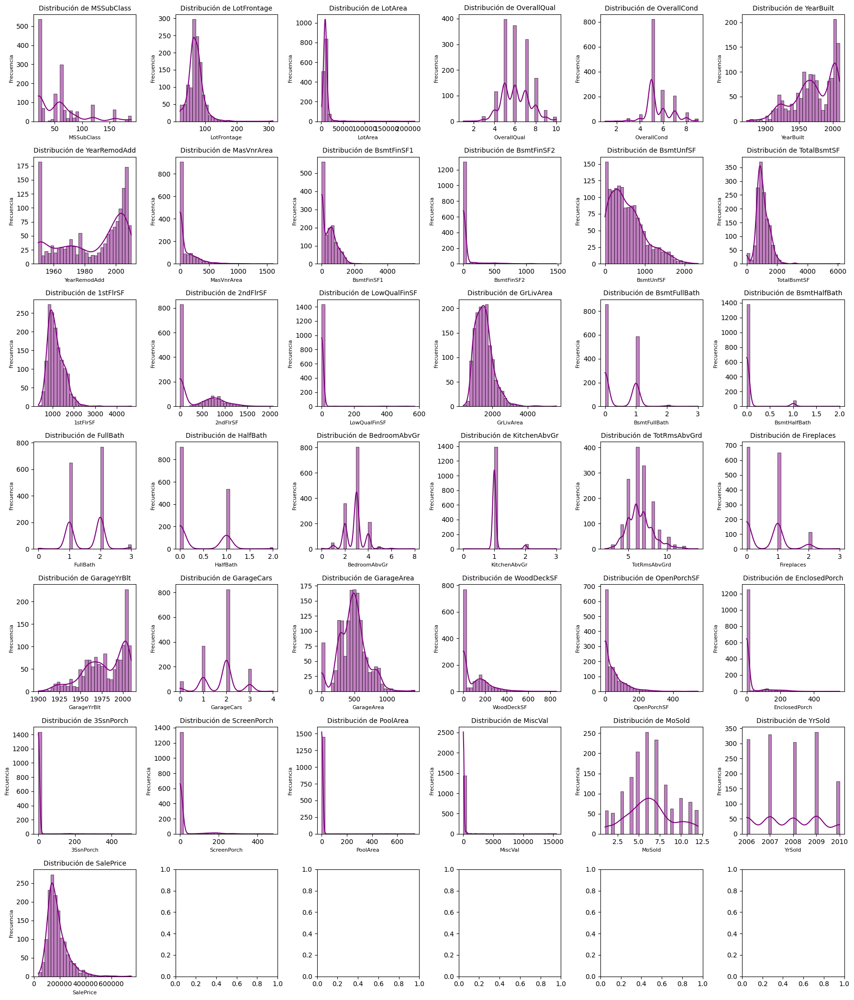

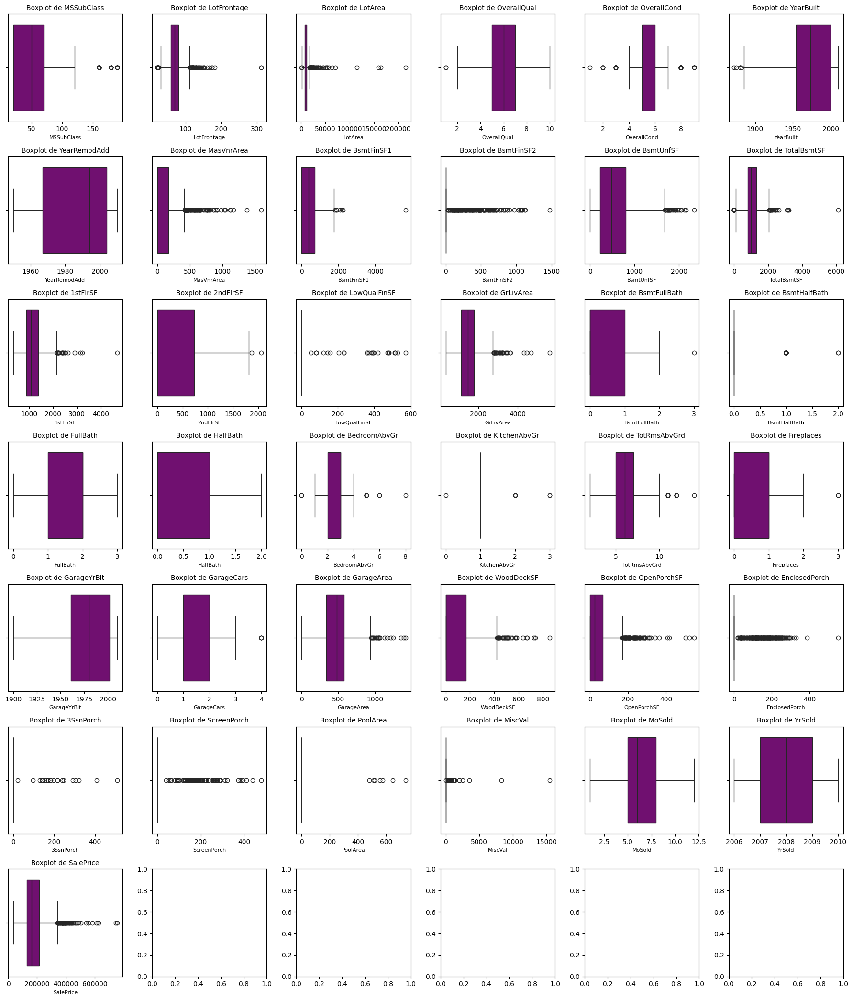

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Variables numéricas clave
numerical_columns = df.select_dtypes(include=['number']).columns

# Ajustar el número de subgráficos por figura
num_cols = len(numerical_columns)
rows = (num_cols // 6) + (num_cols % 6 > 0)  # Seis gráficos por fila

# Visualización de histogramas
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))
axes = axes.flatten()

for i, column in enumerate(numerical_columns):
    sns.histplot(df[column], kde=True, bins=30, color='purple', edgecolor='black', ax=axes[i])
    axes[i].set_title(f'Distribución de {column}', fontsize=10)
    axes[i].set_xlabel(column, fontsize=8)
    axes[i].set_ylabel('Frecuencia', fontsize=8)

plt.tight_layout()
plt.show()

# Visualización de boxplots
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))
axes = axes.flatten()

for i, column in enumerate(numerical_columns):
    sns.boxplot(x=df[column], color='purple', ax=axes[i])
    axes[i].set_title(f'Boxplot de {column}', fontsize=10)
    axes[i].set_xlabel(column, fontsize=8)

plt.tight_layout()
plt.show()


In [7]:
# Contar valores nulos por columna
print(df.isnull().sum())
df=df.fillna(0)

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64


In [8]:
# Variables numéricas clave
numerical_columns = df.select_dtypes(include=['number']).columns

# Variables binarias
binary_columns = ['CentralAir']

# Variables que deberían ser convertidas en dummies
dummy_columns = ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


In [9]:
# Crear las dummy variables para las columnas categóricas
df_dummies = pd.get_dummies(df[dummy_columns], prefix=dummy_columns)

# Convertir columnas booleanas (True/False) a 1/0 usando apply
df_dummies = df_dummies.apply(lambda col: col.map({True: 1, False: 0}) if col.dtype == bool else col)

# Unir las nuevas columnas dummy al DataFrame original
df = pd.concat([df, df_dummies], axis=1)

# Eliminar las columnas originales de tipo categórico si ya no las necesitas
df = df.drop(columns=dummy_columns)

In [10]:
df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,0,0,1,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,0,0,0,1,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,0,0,1,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,0,0,1,1,0,0,0,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,0,0,0,1,0,0,0,0,1,0


In [11]:
# Convertir variables categóricas binarias (Y/N) a 0 y 1
df[binary_columns] = df[binary_columns].apply(lambda x: x.map({'Y': 1, 'N': 0}))
df[numerical_columns] = df[numerical_columns].astype(int)


In [12]:
numerical_columns = df.select_dtypes(include=['number']).columns

In [13]:
# Revisar la información del dataset
print("INFO DEL DATASET:")
df.info()

INFO DEL DATASET:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 303 entries, MSSubClass to SaleCondition_Partial
dtypes: int64(303)
memory usage: 3.4 MB


In [14]:
print(df.columns.tolist())


['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'CentralAir', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice', 'MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Grvl', 'Street_Pave', 'Alley_0', 'Alley_Grvl', 'Alley_Pave', 'LotShape_IR1', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_Bnk', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'Utilities_AllPub', 'Utilities_NoSeWa', 'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'LandSlope_Gtl', 'LandSlope_Mod', 'LandSlope_Sev

In [15]:
# Crear características sumatorias
df['TotalSF'] = df['GrLivArea']+df['GarageArea']+df['TotalBsmtSF']+df['1stFlrSF']+df['2ndFlrSF']+df['BsmtFinSF1'] #superficie total de la vivienda
df['TotalBaths']=df['FullBath']+(df['HalfBath']*0.5)+(df['BsmtHalfBath']*0.5)+df['BsmtFullBath'] #cantidad de baños totales
df['TotalPorchSF'] = df['WoodDeckSF'] + df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch'] #superficie total de porches


In [16]:
# Crear características derivadas
df['HouseAge']=df['YrSold']-df['YearBuilt'] #edad casa
df['TimeSinceRemod']=df['YrSold']-df['YearRemodAdd'] #tiempo desde remodelacion
df['GarageAreaPerCar']=df['GarageArea']/(df['GarageCars']+1) #ratio garaje/coche
df['LotDensity']=df['LotArea']/df['GrLivArea'] #terreno/vivienda
df['BsmtRatio']=(df['BsmtFinSF1']+df['BsmtFinSF2'])/df['TotalBsmtSF'] #ratio sotanos terminados
df['QualityRatio']=df['OverallQual']*(df['ExterQual_Ex']+df['BsmtQual_Ex']+df['KitchenQual_Ex']) #ratio calidad general * ratio calidades excelentes
df['SinceRemodel']=2025-df['YearRemodAdd'] #años desde remodelación
df['AreaQualRatio']=df['GrLivArea']/df['OverallQual'] #ratio espacio/calidad
df['LotToAreaRatio']=df['LotArea']/df['GrLivArea'] #ratio espacio/espacio habitable


In [17]:
# Contar valores nulos por columna
print(df.isnull().sum())
df=df.fillna(0)

MSSubClass         0
LotFrontage        0
LotArea            0
OverallQual        0
OverallCond        0
                  ..
BsmtRatio         37
QualityRatio       0
SinceRemodel       0
AreaQualRatio      0
LotToAreaRatio     0
Length: 315, dtype: int64


In [18]:
numerical_columns = df.select_dtypes(include=['number']).columns


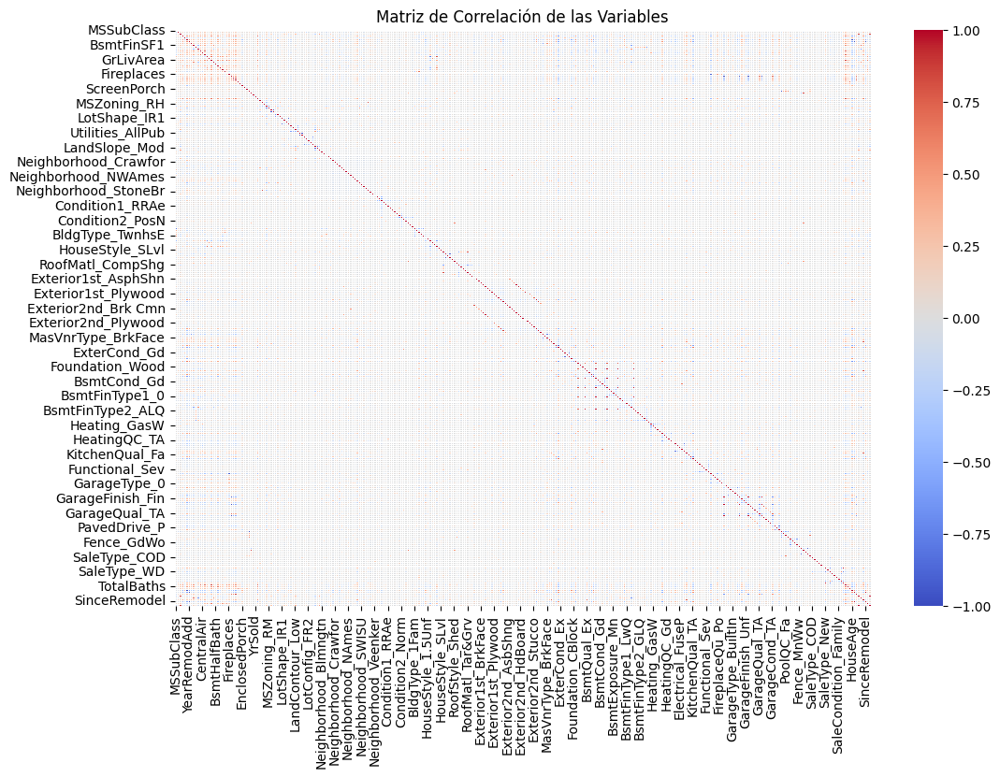

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular la matriz de correlación
corr_matrix = df.corr()

# Visualizar con heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación de las Variables")
plt.show()


In [20]:
pd.set_option('display.max_rows', None)

# Correlación específica con 'price'
price_corr = corr_matrix['SalePrice'].sort_values(ascending=False)

# Mostrar las variables más correlacionadas con 'price'
print(price_corr)


SalePrice                1.000000
TotalSF                  0.801297
OverallQual              0.790982
GrLivArea                0.708624
GarageCars               0.640409
TotalBaths               0.631731
GarageArea               0.623431
QualityRatio             0.620616
TotalBsmtSF              0.613581
1stFlrSF                 0.605852
FullBath                 0.560664
BsmtQual_Ex              0.553105
TotRmsAbvGrd             0.533723
YearBuilt                0.522897
YearRemodAdd             0.507101
KitchenQual_Ex           0.504094
Foundation_PConc         0.497734
MasVnrArea               0.472614
Fireplaces               0.466929
ExterQual_Gd             0.452466
ExterQual_Ex             0.451164
BsmtFinType1_GLQ         0.434597
HeatingQC_Ex             0.434543
GarageFinish_Fin         0.419678
GarageAreaPerCar         0.405940
Neighborhood_NridgHt     0.402149
TotalPorchSF             0.390993
BsmtFinSF1               0.386420
SaleType_New             0.357509
SaleCondition_

In [21]:
# Calcular el número de filas y columnas necesarias según el número de columnas numéricas
num_columns = len(numerical_columns)
num_rows = (num_columns // 3) + (num_columns % 3 > 0)  # Redondear hacia arriba

# Visualización de histogramas para detectar colas largas
plt.figure(figsize=(15, 4 * num_rows))  # Ajustar la altura para que no quede muy apretado
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, 3, i)
    sns.histplot(df[column], kde=True, bins=30, color='purple', edgecolor='black')
    plt.title(f'Distribución de {column}', fontsize=12)
    plt.xlabel(column, fontsize=10)
    plt.ylabel('Frecuencia', fontsize=10)
plt.tight_layout()
plt.show()

# Boxplots para detectar valores atípicos
plt.figure(figsize=(15, 4 * num_rows))  # Ajustar la altura para que no quede muy apretado
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, 3, i)
    sns.boxplot(x=df[column], color='purple')
    plt.title(f'Boxplot de {column} (Valores Atípicos)', fontsize=12)
    plt.xlabel(column, fontsize=10)
plt.tight_layout()
plt.show()

In [22]:
import numpy as np

def remove_outliers_iqr(df, columns):
    # Identificar columnas binarias (con solo 0 y 1)
    binary_columns = [col for col in columns if df[col].nunique() == 2]

    # Filtrar solo las columnas no binarias para aplicar el filtro IQR
    numerical_columns = [col for col in columns if col not in binary_columns]

    if numerical_columns:
        Q1 = df[numerical_columns].quantile(0.10)
        Q3 = df[numerical_columns].quantile(0.90)
        IQR = Q3 - Q1

        # Definimos los límites para detectar outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filtramos los datos dentro del rango permitido
        df = df[~((df[numerical_columns] < lower_bound) | (df[numerical_columns] > upper_bound)).any(axis=1)]

    return df

# Excluir columnas binarias del análisis de outliers
df = remove_outliers_iqr(df, numerical_columns)


In [23]:
# Definir las variables predictoras (X) y la variable objetivo (y)
X = df.drop(columns=['SalePrice'])  # Quitamos 'price' porque es el target transformado
y = df['SalePrice']  # Usamos price como la variable objetivo

In [24]:
from sklearn.model_selection import train_test_split

# Dividir los datos en 80% entrenamiento y 20% prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Mostrar la cantidad de datos en cada conjunto
print(f"Tamaño del conjunto de entrenamiento: {X_train.shape}")
print(f"Tamaño del conjunto de prueba: {X_test.shape}")


Tamaño del conjunto de entrenamiento: (733, 314)
Tamaño del conjunto de prueba: (184, 314)


In [ ]:
# PARA DETERMINAR MEJORES CASOS

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import KFold
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error, r2_score

# Normalizar los datos con RobustScaler
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

# Definir los rangos de los nuevos hiperparámetros a probar
layers_options = [(512, 512, 256),(512, 256, 128),(512,256,256)]  # Diferentes configuraciones de capas

# Configuración de los hiperparámetros previamente obtenidos
lr = 0.01
dropout = 0.2
l2_reg = 0.1
batch_size = 100
activation_function = 'relu'  # Mantener 'relu' ya que fue la mejor función de activación
optimizer = 'adam'  # Mantener 'adam' ya que fue el mejor optimizador
k_folds = 5  # Número de particiones para K-Fold

# Crear un dataframe para almacenar los resultados
results = []

# Definir la validación cruzada K-Fold
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Comenzar a iterar por todas las combinaciones de los nuevos hiperparámetros
for layers in layers_options:
    fold_results = []  # Almacenar los resultados por cada fold

    for fold, (train_idx, val_idx) in enumerate(kf.split(X_scaled)):
        print(f"Entrenando Fold {fold+1}/{k_folds} para configuración {layers}")

        # Dividir los datos en entrenamiento y validación
        X_train_fold, X_val_fold = X_scaled[train_idx], X_scaled[val_idx]
        y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

        # Crear el modelo con la configuración actual
        model = Sequential()
        for i, layer_size in enumerate(layers):
            if i == 0:
                model.add(Dense(layer_size, input_dim=X_train_fold.shape[1], activation=activation_function, kernel_regularizer=tf.keras.regularizers.l2(l2_reg)))
            else:
                model.add(Dense(layer_size, activation=activation_function, kernel_regularizer=tf.keras.regularizers.l2(l2_reg)))
            model.add(Dropout(dropout))

        model.add(Dense(1))  # Capa de salida

        # Compilar el modelo con la tasa de aprendizaje actual
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='mean_squared_error')

        # Definir el callback de EarlyStopping
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        # Entrenar el modelo con EarlyStopping
        history = model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=batch_size,
                            validation_data=(X_val_fold, y_val_fold), verbose=0, callbacks=[early_stopping])

        # Monitorear la cantidad de épocas usadas
        epochs_used = len(history.history['loss'])
        print(f"Fold {fold+1}: El entrenamiento se detuvo en la época {epochs_used}")

        # Realizar predicciones sobre el conjunto de validación
        y_pred_fold = model.predict(X_val_fold).flatten()

        # Evaluar el modelo
        mse = mean_squared_error(y_val_fold, y_pred_fold)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val_fold, y_pred_fold)

        # Convertir a porcentaje (en relación con la escala de los datos)
        mse_percentage = mse / np.var(y_val_fold) * 100  # Relativo a la varianza
        rmse_percentage = rmse / np.mean(y_val_fold) * 100  # Relativo a la media
        r2_percentage = r2 * 100  # R² ya está entre 0 y 1, lo multiplicamos por 100

        fold_results.append({'mse': mse_percentage, 'rmse': rmse_percentage, 'r2': r2_percentage, 'epochs': epochs_used})

    # Promediar los resultados de los 5 folds
    avg_mse = np.mean([fr['mse'] for fr in fold_results])
    avg_rmse = np.mean([fr['rmse'] for fr in fold_results])
    avg_r2 = np.mean([fr['r2'] for fr in fold_results])
    avg_epochs = np.mean([fr['epochs'] for fr in fold_results])

    # Almacenar los resultados
    results.append({
        'lr': lr,
        'dropout': dropout,
        'l2_reg': l2_reg,
        'batch_size': batch_size,
        'layers': layers,
        'activation': activation_function,
        'optimizer': optimizer,
        'mse': avg_mse,
        'rmse': avg_rmse,
        'r2': avg_r2,
        'avg_epochs': avg_epochs
    })

# Convertir los resultados en un DataFrame
results_df = pd.DataFrame(results)

# Mostrar los resultados ordenados por R²
best_config = results_df.sort_values(by='r2', ascending=False).head(1)
print("Mejor configuración encontrada:")
print(best_config)

# Mostrar las primeras filas de los resultados
print(results_df.head())

Entrenando Fold 1/5 para configuración (512, 512, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: El entrenamiento se detuvo en la época 66
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Entrenando Fold 2/5 para configuración (512, 512, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2: El entrenamiento se detuvo en la época 64
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Entrenando Fold 3/5 para configuración (512, 512, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3: El entrenamiento se detuvo en la época 82
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Entrenando Fold 4/5 para configuración (512, 512, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4: El entrenamiento se detuvo en la época 87
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Entrenando Fold 5/5 para configuración (512, 512, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5: El entrenamiento se detuvo en la época 73
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Entrenando Fold 1/5 para configuración (512, 256, 128)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: El entrenamiento se detuvo en la época 92
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Entrenando Fold 2/5 para configuración (512, 256, 128)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2: El entrenamiento se detuvo en la época 87
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Entrenando Fold 3/5 para configuración (512, 256, 128)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3: El entrenamiento se detuvo en la época 80
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Entrenando Fold 4/5 para configuración (512, 256, 128)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4: El entrenamiento se detuvo en la época 100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Entrenando Fold 5/5 para configuración (512, 256, 128)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5: El entrenamiento se detuvo en la época 74
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 659ms/step
Entrenando Fold 1/5 para configuración (512, 256, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: El entrenamiento se detuvo en la época 82
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Entrenando Fold 2/5 para configuración (512, 256, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2: El entrenamiento se detuvo en la época 63
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Entrenando Fold 3/5 para configuración (512, 256, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3: El entrenamiento se detuvo en la época 90
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Entrenando Fold 4/5 para configuración (512, 256, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4: El entrenamiento se detuvo en la época 73
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Entrenando Fold 5/5 para configuración (512, 256, 256)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5: El entrenamiento se detuvo en la época 74
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Mejor configuración encontrada:
     lr  dropout  l2_reg  batch_size           layers activation optimizer  \
1  0.01      0.2     0.1         100  (512, 256, 128)       relu      adam   

         mse      rmse         r2  avg_epochs  
1  10.699488  9.253471  89.300512        86.6  
     lr  dropout  l2_reg  batch_size           layers activation optimizer  \
0  0.01      0.2     0.1         100  (512, 512, 256)       relu      adam   
1  0.01      0.2     0.1         100  (512, 256, 128)       relu      adam   
2  0.01      0.2     0.1         100  (512, 256, 256)       relu      adam   

         mse      rmse         r2  avg_epochs  
0  11.170155  9.484562  88.829846        74.4  
1  10.699488  9.253471  89.300512        86.6  
2  10.856789  9.374904  89.143212        76.4  


In [ ]:
# Importar las librerías necesarias
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Definir la validación cruzada K-Fold con k=5
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Hiperparámetros
lr = 0.001
dropout = 0.2
l2_reg = 0.01
batch_size = 100
epochs = 400

# Lista para almacenar resultados
results = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"Entrenando Fold {fold+1}/{k_folds}")

    # Dividir datos en entrenamiento y validación
    X_train_fold, X_val_fold = X.iloc[train_idx].values, X.iloc[val_idx].values
    y_train_fold, y_val_fold = y.iloc[train_idx].values, y.iloc[val_idx].values

    # Definir el modelo
    model = Sequential([
        Dense(512, input_dim=X_train_fold.shape[1], activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_reg)),
        Dropout(dropout),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_reg)),
        Dropout(dropout),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_reg)),
        Dropout(dropout),
        Dense(1)  # Capa de salida para regresión
    ])

    # Compilar el modelo
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='mean_squared_error')

    # Callback de EarlyStopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Entrenar el modelo
    history = model.fit(X_train_fold, y_train_fold, epochs=epochs, batch_size=batch_size,
                        validation_data=(X_val_fold, y_val_fold), verbose=0, callbacks=[early_stopping])

    # Obtener el número de épocas efectivas
    epochs_used = len(history.history['loss'])
    print(f"Fold {fold+1}: Se detuvo en la época {epochs_used}")

    # Evaluar el modelo en el conjunto de validación
    y_pred_fold = model.predict(X_val_fold).flatten()
    mse = mean_squared_error(y_val_fold, y_pred_fold)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_val_fold, y_pred_fold)

    # Expresar las métricas en porcentaje
    mse_percentage = mse / np.var(y_val_fold) * 100  # Relativo a la varianza
    rmse_percentage = rmse / np.mean(y_val_fold) * 100  # Relativo a la media
    r2_percentage = r2 * 100  # R² ya está entre 0 y 1, se multiplica por 100

    # Guardar resultados del fold
    results.append({'mse': mse_percentage, 'rmse': rmse_percentage, 'r2': r2_percentage, 'epochs': epochs_used})

# Calcular promedio de los resultados de los folds
avg_mse = np.mean([r['mse'] for r in results])
avg_rmse = np.mean([r['rmse'] for r in results])
avg_r2 = np.mean([r['r2'] for r in results])
avg_epochs = np.mean([r['epochs'] for r in results])

# Mostrar métricas en porcentaje
print(f"\nResultados Finales:")
print(f"MSE: {avg_mse:.4f} %")
print(f"RMSE: {avg_rmse:.4f} %")
print(f"R²: {avg_r2:.4f} %")
print(f"Épocas promedio: {avg_epochs:.1f}")


Entrenando Fold 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: Se detuvo en la época 111
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Entrenando Fold 2/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2: Se detuvo en la época 101
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Entrenando Fold 3/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3: Se detuvo en la época 182
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Entrenando Fold 4/5


Fold 4: Se detuvo en la época 134
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Entrenando Fold 5/5
Fold 5: Se detuvo en la época 162
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

Resultados Finales:
MSE: 12.4275 %
RMSE: 12.3662 %
R²: 87.5725 %
Épocas promedio: 138.0


In [ ]:
import tensorflow as tf

print(model.input_shape)


(None, 314)


In [ ]:
# Guardar el modelo entrenado
model.save('/content/drive/MyDrive/Colab Notebooks/model.keras')


## **4.4 Evaluación en Conjunto de Test**
El alumno comparará las métricas finales con las del conjunto de entrenamiento para verificar si hay sobreajuste.